In [1]:
# DCGAN = Deep Convolutional Generative Adversarial Network
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  999


In [33]:
# Define inputs
'''dataroot - the path to the root of the dataset folder. We will talk more about the dataset in the next section.

workers - the number of worker threads for loading the data with the DataLoader.

batch_size - the batch size used in training. The DCGAN paper uses a batch size of 128.

image_size - the spatial size of the images used for training. This implementation defaults to 64x64. 
If another size is desired, the structures of D and G must be changed. See here for more details.

nc - number of color channels in the input images. For color images this is 3.

nz - length of latent vector.

ngf - relates to the depth of feature maps carried through the generator.

ndf - sets the depth of feature maps propagated through the discriminator.

num_epochs - number of training epochs to run. 
Training for longer will probably lead to better results but will also take much longer.

lr - learning rate for training. As described in the DCGAN paper, this number should be 0.0002.

beta1 - beta1 hyperparameter for Adam optimizers. As described in paper, this number should be 0.5.

ngpu - number of GPUs available. If this is 0, code will run in CPU mode. 
If this number is greater than 0 it will run on that number of GPUs.'''

# Root directory for dataset
dataroot = "data/album_covers"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 90

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

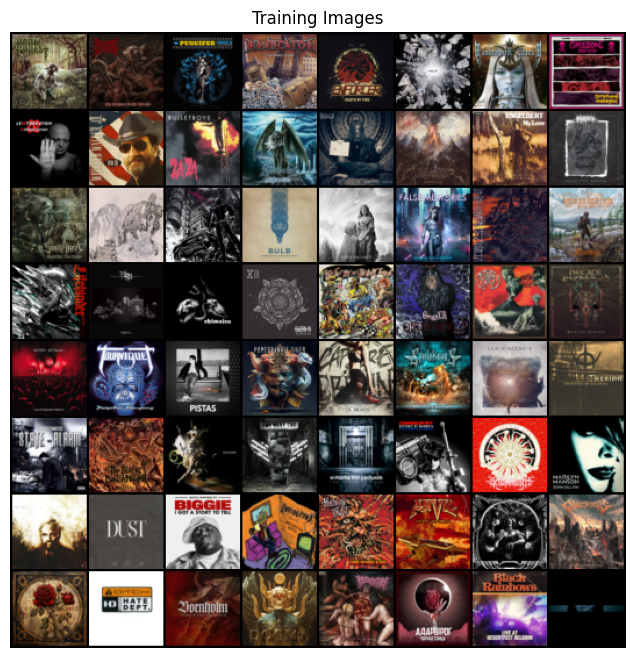

In [3]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

In [4]:
# custom weights initialization called on ``netG`` and ``netD``
'''From the DCGAN paper, the authors specify that all model weights shall be randomly initialized from a Normal distribution 
with mean=0, stdev=0.02. The weights_init function takes an initialized model as input and reinitializes all 
convolutional, convolutional-transpose, and batch normalization layers to meet this criteria. 
This function is applied to the models immediately after initialization.'''
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [6]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [7]:
# Discriminator
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [8]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [9]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [34]:
# Load discriminator and generator states
checkpoint = torch.load('checkpoint_70.pth')
netD.load_state_dict(checkpoint['D_state_dict'])
netG.load_state_dict(checkpoint['G_state_dict'])
optimizerD.load_state_dict(checkpoint['D_optimizer_state_dict'])
optimizerG.load_state_dict(checkpoint['G_optimizer_state_dict'])
cp_epoch = checkpoint['epoch']

In [80]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
D_x_values = []  # List to store D(x) values
D_G_z_values = []  # List to store D(G(z)) values
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(cp_epoch+1,num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()
        
        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        D_x_values.append(D_x)  # Store D(x) value
        D_G_z_values.append(D_G_z2)  # Store D(G(z)) value

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

# Plot D(x) and D(G(z)) values
plt.figure(figsize=(10, 5))
plt.plot(D_x_values, label='D(x)', alpha=0.7)
plt.plot(D_G_z_values, label='D(G(z))', alpha=0.7)

plt.title('Discriminator Outputs')
plt.xlabel('Iterations or Epochs')
plt.ylabel('Output')
plt.legend()
plt.grid(True)
plt.show()

Starting Training Loop...
[201/800][0/232]	Loss_D: 0.0361	Loss_G: 5.8787	D(x): 0.9718	D(G(z)): 0.0067 / 0.0068
[201/800][50/232]	Loss_D: 0.0414	Loss_G: 5.6293	D(x): 0.9692	D(G(z)): 0.0083 / 0.0101
[201/800][100/232]	Loss_D: 0.0160	Loss_G: 6.8557	D(x): 0.9922	D(G(z)): 0.0079 / 0.0043
[201/800][150/232]	Loss_D: 0.0485	Loss_G: 5.9868	D(x): 0.9957	D(G(z)): 0.0412 / 0.0055
[201/800][200/232]	Loss_D: 0.0179	Loss_G: 5.4516	D(x): 0.9990	D(G(z)): 0.0163 / 0.0101
[202/800][0/232]	Loss_D: 0.0323	Loss_G: 5.6082	D(x): 0.9738	D(G(z)): 0.0053 / 0.0092
[202/800][50/232]	Loss_D: 0.0105	Loss_G: 6.0169	D(x): 0.9988	D(G(z)): 0.0092 / 0.0059
[202/800][100/232]	Loss_D: 0.1946	Loss_G: 0.7643	D(x): 0.8479	D(G(z)): 0.0085 / 0.6226
[202/800][150/232]	Loss_D: 0.4911	Loss_G: 3.1193	D(x): 0.7513	D(G(z)): 0.0896 / 0.1308
[202/800][200/232]	Loss_D: 0.1679	Loss_G: 4.4445	D(x): 0.9005	D(G(z)): 0.0179 / 0.0292
[203/800][0/232]	Loss_D: 0.1812	Loss_G: 6.4345	D(x): 0.9967	D(G(z)): 0.1359 / 0.0041
[203/800][50/232]	Loss_D:

KeyboardInterrupt: 

In [35]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
D_x_values = []  # List to store D(x) values
D_G_z_values = []  # List to store D(G(z)) values
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(cp_epoch + 1,num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        D_x_values.append(D_x)  
        D_G_z_values.append(D_G_z2)  

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs - 1) and (i == len(dataloader) - 1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1


Starting Training Loop...
[71/90][0/232]	Loss_D: 0.1216	Loss_G: 4.0903	D(x): 0.9744	D(G(z)): 0.0867 / 0.0254
[71/90][50/232]	Loss_D: 0.0918	Loss_G: 3.4984	D(x): 0.9584	D(G(z)): 0.0459 / 0.0520
[71/90][100/232]	Loss_D: 0.1235	Loss_G: 3.3211	D(x): 0.9391	D(G(z)): 0.0554 / 0.0583
[71/90][150/232]	Loss_D: 0.1236	Loss_G: 4.3702	D(x): 0.9844	D(G(z)): 0.0943 / 0.0197
[71/90][200/232]	Loss_D: 0.1013	Loss_G: 4.2015	D(x): 0.9450	D(G(z)): 0.0408 / 0.0297
[72/90][0/232]	Loss_D: 0.1302	Loss_G: 4.0517	D(x): 0.9342	D(G(z)): 0.0535 / 0.0307
[72/90][50/232]	Loss_D: 0.1183	Loss_G: 4.3429	D(x): 0.9593	D(G(z)): 0.0694 / 0.0199
[72/90][100/232]	Loss_D: 0.0655	Loss_G: 4.6456	D(x): 0.9625	D(G(z)): 0.0256 / 0.0177
[72/90][150/232]	Loss_D: 0.0965	Loss_G: 4.4708	D(x): 0.9501	D(G(z)): 0.0405 / 0.0188
[72/90][200/232]	Loss_D: 2.4699	Loss_G: 8.9787	D(x): 0.9924	D(G(z)): 0.7871 / 0.0011
[73/90][0/232]	Loss_D: 0.3479	Loss_G: 3.8871	D(x): 0.9519	D(G(z)): 0.2140 / 0.0399
[73/90][50/232]	Loss_D: 0.0763	Loss_G: 4.4658	D

In [36]:
torch.save({
            'epoch': num_epochs,
            'D_state_dict': netD.state_dict(),
            'G_state_dict': netG.state_dict(),
            'D_optimizer_state_dict': optimizerD.state_dict(),
            'G_optimizer_state_dict': optimizerG.state_dict(),
            # Add other relevant parameters you want to save
            }, f'checkpoint_{num_epochs}.pth')

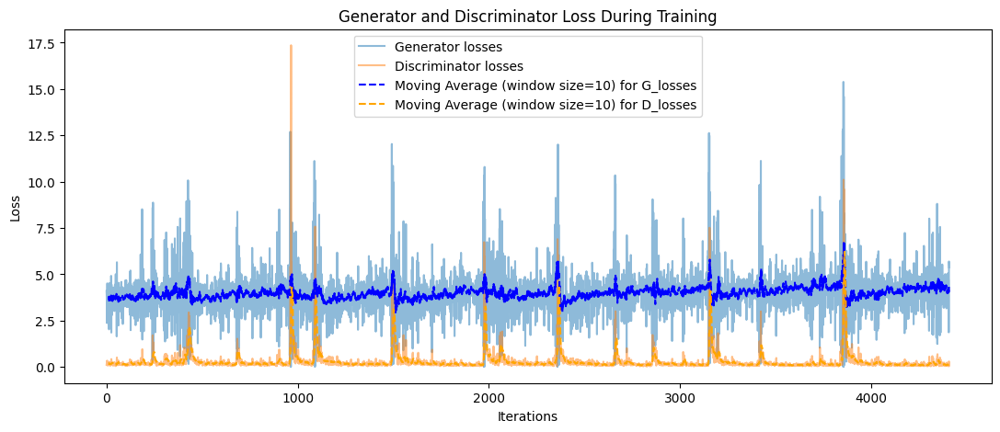

In [37]:
# Function to calculate moving averages
def moving_average(data, window_size):
    cumsum = np.cumsum(data)
    cumsum[window_size:] = cumsum[window_size:] - cumsum[:-window_size]
    return cumsum[window_size - 1:] / window_size

window_size = 10  # Adjust window size as needed

# Calculate moving averages for G_losses and D_losses
G_losses_avg = moving_average(G_losses, window_size)
D_losses_avg = moving_average(D_losses, window_size)

# Plotting
plt.figure(figsize=(13, 5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="Generator losses", alpha=0.5)
plt.plot(D_losses, label="Discriminator losses", alpha=0.5)
plt.plot(np.arange(window_size - 1, len(G_losses)), G_losses_avg, color='blue', linestyle='--', label=f"Moving Average (window size={window_size}) for G_losses")
plt.plot(np.arange(window_size - 1, len(D_losses)), D_losses_avg, color='orange', linestyle='--', label=f"Moving Average (window size={window_size}) for D_losses")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

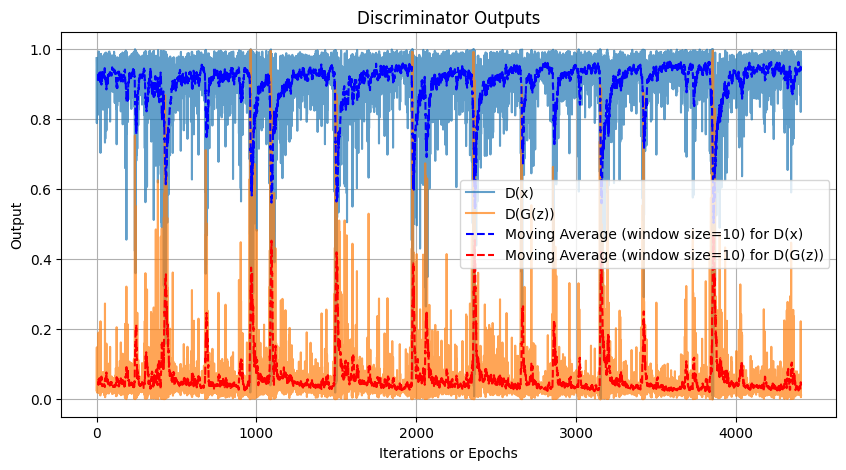

<Figure size 640x480 with 0 Axes>

In [38]:
# Plot D(x) and D(G(z)) values
savepath = f'discriminator_outputs_{num_epochs}.png'
plt.figure(figsize=(10, 5))
plt.plot(D_x_values, label='D(x)', alpha=0.7)
plt.plot(D_G_z_values, label='D(G(z))', alpha=0.7)

D_X_avg = moving_average(D_x_values, window_size)
D_G_z_avg = moving_average(D_G_z_values, window_size)

plt.plot(np.arange(window_size - 1, len(D_x_values)), D_X_avg, color='blue', linestyle='--', label=f"Moving Average (window size={window_size}) for D(x)")
plt.plot(np.arange(window_size - 1, len(D_G_z_values)), D_G_z_avg, color='red', linestyle='--', label=f"Moving Average (window size={window_size}) for D(G(z))")
plt.title('Discriminator Outputs')
plt.xlabel('Iterations or Epochs')
plt.ylabel('Output')
plt.legend()
plt.grid(True)
plt.show()
plt.savefig(savepath, dpi=600)


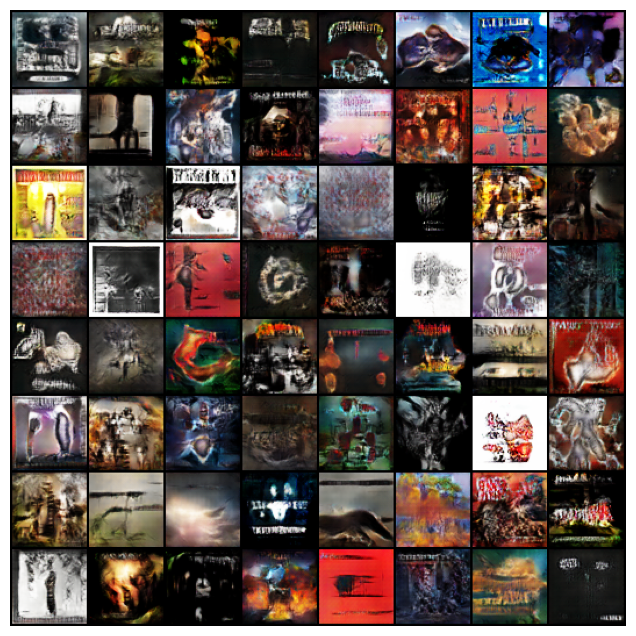

In [39]:
# Define the path to save the animation
save_path = f"animation_{num_epochs}.gif"

# Generator progression
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

# Save the animation
ani.save(save_path, writer='pillow', fps=10)  # Adjust fps as needed

# Display the animation
HTML(ani.to_jshtml())

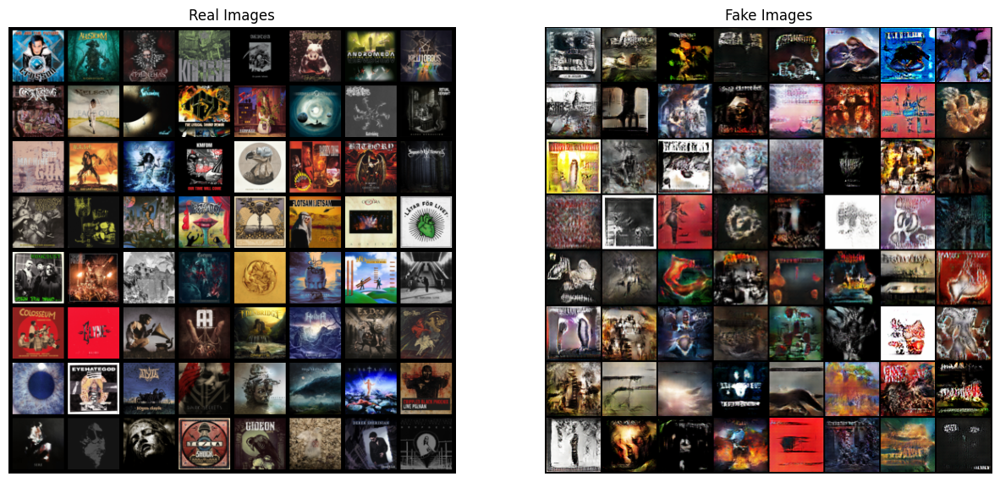

In [40]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()